
# <a id='toc1_'></a>[ ](#toc0_)
|
$\LARGE \textbf{\textcolor{red}{ Computational Screening of GDB-9 Molecules for Organic Semiconductors}}$
|
---

 ###  **MVOTO KONGO Patrick Sorrel**, sorrel.mvoto@facsciences-uy1.cm

 
* Department of Physics, Faculty of Science, University of Yaounde I,  Ph.D Candidate
* AtomiC Molecular Physics et Biophysics
  
18 JANVIER 2025

---

<table width="100%"><tr style="background-color:white;">
    <td style="text-align:left;padding:0px;width:142px'">
        <a href="https://qworld.net" target="_blank">
            <img src="images/QC.jpg"></a></td>
            <img src="images/ML.jpeg"></a></td>
    <td width="*">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</td>
    <!-- ############################################# -->
    <td style="padding:0px;width:40px;">
        <a href="https://github.com/GitNindjapatrick/" target="_blank">
        <img align="right" src="images/github.png" width="40px"></a> </td>
    <td style="padding:0px;width:5px;"></td>
    <td style="padding:0px;width:40px;">
        <a href="https://linkedin.com/in/patrick-sorrel-mvoto-kongo-641a41273" target="_blank">
        <img align="right" src="images/LinkedIn.png"></a></td>
    <td style="padding:0px;width:5px;"></td>
    <!-- ############################################# -->
    <td style="padding:0px;width:40px;">
        <a href="https://discord.MVOTO.net"
           target="_blank">
        <img align="right" src="images/discord.jpeg"></a></td>
</tr></table>


[Assessing the Synthetic Compatibility of GDB-9 Molecules with PCBM and PCDTBT for Organic Solar Cells: A Computational Approach](First_test_result.ipynb) &nbsp;|&nbsp;
[Computational Screening of GDB-9 Molecules for Organic Semiconductors](MVOTO_EXTRACTION_GDB.ipynb)&nbsp;|&nbsp;
[PCE: Designing Organic Donor and Acceptor Molecules for Photovoltaic Devices](PCE_GDB9.ipynb) &nbsp;|&nbsp;
|[gdb9: Openbabel xTB-crest and Pyscf Quantum Chemistry Calculations Assessment](MVOTO_PROPRIETES.ipynb)&nbsp;|&nbsp;




## 1. Introduction
Organic semiconductors are increasingly studied due to their potential in flexible and low-cost electronic devices. This notebook explores the GDB-9 molecular database to identify candidates for organic semiconductors based on their HOMO_DFT-LUMO_DFT GAP_DFTs and other electronic properties.

### Objectives:
- Analyze the HOMO_DFT-LUMO_DFT GAP_DFT of GDB-9 molecules.
- Evaluate their potential as organic semiconductors using selection criteria inspired by CEPDB.

---

## 2. Methodology

### 2.1 Selection Criteria
The following criteria, inspired by CEPDB, are used to filter molecules:
- **HOMO_DFT-LUMO_DFT GAP_DFT**: Between 0.8 eV and 1.5 eV.
- **Stability**: Ionization potential (IP) and electron affinity (EA) within acceptable ranges.
- **Dipole Moment**: Below 5 Debye for better charge transport.

### 2.2 Computational Tools
- **Software**: PySCF for DFT calculations, xTB CREST for molecular dynamics.
- **Functional**: B3LYP with 6-31G(2df,p) basis set.
- **Analysis**:
  - HOMO_DFT-LUMO_DFT GAP_DFT calculation.
  - Binding energy and charge transfer analysis.
  - Molecular dynamics simulations in solvents like chloroform or toluene.

---

## 3. Results and Discussion

### 3.1 Electronic Properties
- HOMO_DFT-LUMO_DFT levels are visualized to assess energy alignment with standard acceptor materials like PCBM.
- Ionization potential and electron affinity are calculated to predict charge transfer feasibility.

### 3.2 Stability Analysis
- Binding energies between GDB-9 molecules and PCBM/PCDTBT are computed.
- Non-covalent interactions (e.g., π-π stacking) are analyzed using NCI plots.

### 3.3 Charge Transfer Efficiency
- Charge transfer integrals are computed to estimate electronic coupling.
- Transition dipole moments and reorganization energies are analyzed for exciton dissociation efficiency.


---

## References
1. [CEPDB Database](https://cepdb.org)
2. Relevant DOI references (e.g., [1], [3])


In [5]:
import pandas as pd

# Chargement de la base de données
input_file = "dataset_for_ml.pkl"  # Nom de votre fichier d'entrée
output_csv = "filtered_molecules.csv"  # Nom du fichier CSV de sortie
output_pkl = "b_filtered_molecules.pkl"  # Nom du fichier PKL de sortie

data = pd.read_pickle(input_file)
print(f"Nombre total de molécules dans la base : {len(data)}")

# Critères de sélection
GAP_DFT_MIN = -1.49   # GAP_DFT énergétique minimal en eV
GAP_DFT_MAX = 3.8     # GAP_DFT énergétique maximal en eV
LUMO_DFT_MIN = -6.09  # LUMO_DFT minimal en eV
LUMO_DFT_MAX = -1.15  # LUMO_DFT maximal en eV
HOMO_DFT_MIN = -7.51  # HOMO_DFT minimal en eV
HOMO_DFT_MAX = -3.63  # HOMO_DFT maximal en eV
SCHARBER_GAP_DFT_MIN = -1.49  # GAP_DFT minimal pour le modèle de Scharber en eV
SCHARBER_GAP_DFT_MAX = 3.8    # GAP_DFT maximal pour le modèle de Scharber en eV

# Vérification des colonnes attendues
required_columns = ["HOMO_DFT(eV)", "LUMO_DFT(eV)", "GAP_DFT(eV)"]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"La colonne '{col}' est manquante dans le fichier CSV.")

# Ajout du GAP_DFT pour le modèle de Scharber
data["Scharber_GAP_DFT(eV)"] = data["GAP_DFT(eV)"]

# Étape 1 : Filtrer selon le HOMO_DFT
filtered_HOMO_DFT = data[(data["HOMO_DFT(eV)"] >= HOMO_DFT_MIN) & (data["HOMO_DFT(eV)"] <= HOMO_DFT_MAX)]
print(f"Nombre de molécules après filtrage HOMO_DFT : {len(filtered_HOMO_DFT)}")

# Étape 2 : Filtrer selon le LUMO_DFT
filtered_LUMO_DFT = filtered_HOMO_DFT[(filtered_HOMO_DFT["LUMO_DFT(eV)"] >= LUMO_DFT_MIN) & (filtered_HOMO_DFT["LUMO_DFT(eV)"] <= LUMO_DFT_MAX)]
print(f"Nombre de molécules après filtrage LUMO_DFT : {len(filtered_LUMO_DFT)}")

# Étape 3 : Filtrer selon le GAP_DFT énergétique
filtered_GAP_DFT = filtered_LUMO_DFT[
    (filtered_LUMO_DFT["GAP_DFT(eV)"] >= GAP_DFT_MIN) & 
    (filtered_LUMO_DFT["GAP_DFT(eV)"] <= GAP_DFT_MAX)
]
print(f"Nombre de molécules après filtrage GAP_DFT énergétique : {len(filtered_GAP_DFT)}")

# Étape 4 : Filtrer selon le GAP_DFT pour le modèle de Scharber
filtered_scharber = filtered_GAP_DFT[
    (filtered_GAP_DFT["Scharber_GAP_DFT(eV)"] >= SCHARBER_GAP_DFT_MIN) & 
    (filtered_GAP_DFT["Scharber_GAP_DFT(eV)"] <= SCHARBER_GAP_DFT_MAX)
]
print(f"Nombre de molécules après filtrage Scharber GAP_DFT : {len(filtered_scharber)}")

# Création explicite d'un DataFrame final
final_dataframe = filtered_scharber.copy()

# Enregistrer les molécules filtrées dans les fichiers
final_dataframe.to_csv(output_csv, index=False)
final_dataframe.to_pickle(output_pkl)

# Afficher un aperçu des données finales
print("\nAperçu des molécules filtrées :")
print(final_dataframe.head())



Nombre total de molécules dans la base : 524
Nombre de molécules après filtrage HOMO_DFT : 513
Nombre de molécules après filtrage LUMO_DFT : 438
Nombre de molécules après filtrage GAP_DFT énergétique : 327
Nombre de molécules après filtrage Scharber GAP_DFT : 327

Aperçu des molécules filtrées :
  smiles_key                   SMILES  HOMO(eV)  HOMO_xtb(eV)  HOMO_DFT(eV)  \
1    gdb 723              C1=NN=CN=N1 -6.734818      -10.1217     -6.471639   
3   gdb 1589           NC(=O)C(=O)C=O -6.753866      -11.1089     -6.732598   
4   gdb 2115             O=C1CC=CC1=O -6.386512      -10.8568     -6.429667   
6   gdb 2125              O=C1COCC1=O -6.514406      -11.2428     -6.699582   
7   gdb 4019  NC(=[NH2+])C(C=O)=N[O-] -4.963357       -9.2809     -4.994395   

   LUMO(eV)  LUMO_xtb(eV)  LUMO_DFT(eV)   GAP(eV)  GAP_xtb(eV)  GAP_DFT(eV)  \
1 -3.050396       -9.5066     -2.868605  3.687143     0.615100     3.603034   
3 -3.311626       -9.9451     -3.399369  3.442240     1.163798     3.3

In [8]:
from rdkit import Chem
from rdkit.Chem import AllChem, Descriptors, DataStructs
import pandas as pd
import numpy as np

def calculate_fingerprint(smiles, radius=3, nBits=512):
    """
    Calcule un Morgan Fingerprint pour une molécule donnée.
    """
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius=radius, nBits=nBits)
        return np.array(fp)  # Convertir en tableau numpy pour l'analyse
    else:
        return None

input_file = "dataset_for_ml.pkl" 
selected_molecules = pd.read_pickle(input_file)


# Calcul des fingerprints
selected_molecules['Fingerprint'] = selected_molecules['SMILES'].apply(calculate_fingerprint)

print("Fingerprints calculés avec succès.")


Fingerprints calculés avec succès.


In [9]:
selected_molecules

,smiles_key,SMILES,HOMO(eV),HOMO_xtb(eV),HOMO_DFT(eV),LUMO(eV),LUMO_xtb(eV),LUMO_DFT(eV),GAP(eV),GAP_xtb(eV),GAP_DFT(eV),Fingerprint
0,gdb 326,O=CC(=O)C=O,-7.091287,-11.4928,-6.913515,-3.959257,-9.1664,-2.552447,3.132031,2.326330,4.361068,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ..."
1,gdb 723,C1=NN=CN=N1,-6.734818,-10.1217,-6.471639,-3.050396,-9.5066,-2.868605,3.687143,0.615100,3.603034,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,gdb 1587,CC(=O)C(=O)C=O,-6.772914,-11.2156,-6.644032,-3.126588,-9.1516,-2.517150,3.646326,2.064026,4.126882,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,gdb 1589,NC(=O)C(=O)C=O,-6.753866,-11.1089,-6.732598,-3.311626,-9.9451,-3.399369,3.442240,1.163798,3.333229,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,gdb 2115,O=C1CC=CC1=O,-6.386512,-10.8568,-6.429667,-2.587803,-9.2243,-2.655859,3.798709,1.632489,3.773808,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
519,gdb 133853,OC12C3C1N1CC3N=C21,-5.679016,-9.9375,-5.606204,-2.419092,-8.7319,-2.561790,3.259924,1.205589,3.044415,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, ..."
520,gdb 133854,CC12CC34CC=C(C13)C24,-4.285793,-8.4207,-4.369375,-2.481678,-7.7140,-1.807196,1.804115,0.706681,2.562179,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
521,gdb 133858,CC1N2C3C4=CCC13C24,-4.606888,-8.6748,-4.602213,-2.832705,-7.9451,-2.068744,1.774182,0.729718,2.533469,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
522,gdb 133864,C1C2CC3OC4CC1C234,-3.771498,-9.9408,-5.314896,-1.736086,-8.5677,-1.985876,2.032691,1.373099,3.329020,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [11]:
from mordred import Calculator, descriptors

def calculate_mordred_descriptors(smiles):
    """
    Calcule des descripteurs Mordred pour une molécule donnée.
    """
    mol = Chem.MolFromSmiles(smiles)
    calc = Calculator(descriptors, ignore_3D=True)
    return calc(mol)

# Calcul des descripteurs pour toutes les molécules
selected_molecules['Mordred_Descriptors'] = selected_molecules['SMILES'].apply(calculate_mordred_descriptors)

# Convertir les descripteurs Mordred en DataFrame
mordred_df = pd.DataFrame(selected_molecules['Mordred_Descriptors'].tolist(), index=selected_molecules.index)
print("Descripteurs Mordred calculés avec succès.")


Descripteurs Mordred calculés avec succès.


In [2]:
import os
import json
import pandas as pd
from shutil import copy2

# Define paths
source_dir = "Compound_000000001_000025000"
xyz_output_dir = "B3LYP@PM6.S0.xyz"
os.makedirs(xyz_output_dir, exist_ok=True)

# Containers
opv_data = []     # Dataset 1: OPV-relevant properties
extra_data = []   # Dataset 2: Structural and additional electronic properties

# Loop over molecules
for i in range(1, 25000):
    mol_id = f"{i:09d}"
    mol_folder = os.path.join(source_dir, mol_id)
    
    json_file = os.path.join(mol_folder, f"{mol_id}.B3LYP@PM6.S0.json")
    xyz_file = os.path.join(mol_folder, f"{mol_id}.B3LYP@PM6.S0.xyz")
    
    if os.path.exists(xyz_file):
        copy2(xyz_file, os.path.join(xyz_output_dir, f"{mol_id}.xyz"))

    if os.path.exists(json_file):
        with open(json_file, 'r') as f:
            data = json.load(f)
            try:
                pubchem = data["pubchem"]
                desc = pubchem.get("B3LYP@PM6", {})
                props = desc.get("properties", {})
                energy = props.get("energy", {})
                atoms = desc.get("atoms", {})
                coords = atoms.get("coords", {}).get("3d", [])
                charges = props.get("partial charges", {})
                mulliken = charges.get("mulliken", [])
                lowdin = charges.get("lowdin", [])

                opv_data.append({
                    "mol_id": mol_id,
                    "SMILES": pubchem.get("openbabel", {}).get("Canonical SMILES"),
                    "formula": pubchem.get("molecular formula", ""),
                    "mass": pubchem.get("molecular weight"),
                    "inchi": pubchem.get("InChI"),
                    "HOMO(eV)": energy.get("alpha", {}).get("homo"),
                    "LUMO(eV)": energy.get("alpha", {}).get("lumo"),
                    "GAP(eV)": energy.get("alpha", {}).get("gap"),
                    "dipole_moment": props.get("total dipole moment"),
                    "mulliken_charges": mulliken,
                })

                extra_data.append({
                    "mol_id": mol_id,
                    "SMILES": pubchem.get("openbabel", {}).get("Canonical SMILES"),
                    "formula": pubchem.get("molecular formula", ""),
                    "mass": pubchem.get("molecular weight"),
                    "inchi": pubchem.get("InChI"),
                    "charge": pubchem.get("charge", None),
                    "multiplicity": props.get("multiplicity", None),
                    "num_atoms": atoms.get("elements", {}).get("atom count", None),
                    "basis_number": props.get("orbitals", {}).get("basis number", None),
                    "mulliken_charges": mulliken,
                    "lowdin_charges": lowdin,
                    "coords_3d": coords
                })

            except Exception as e:
                continue

# Save the two datasets
opv_df = pd.DataFrame(opv_data)
extra_df = pd.DataFrame(extra_data)

# Output file paths
opv_csv_path = "dataset_opv_properties.csv"
extra_csv_path = "dataset_structural_electronic.csv"
opv_pkl_path = "dataset_opv_properties.pkl"
extra_pkl_path = "dataset_structural_electronic.pkl"

# Save as CSV and PKL
opv_df.to_csv(opv_csv_path, index=False)
extra_df.to_csv(extra_csv_path, index=False)
opv_df.to_pickle(opv_pkl_path)
extra_df.to_pickle(extra_pkl_path)

opv_df.head(), extra_df.head()


(      mol_id                                  SMILES     formula        mass  \
 0  000000001        [O-]C(=O)CC(C[N+](C)(C)C)OC(=O)C    C9H17NO4  203.235580   
 1  000000003                    OC1C=CC=C(C1O)C(=O)O      C7H8O4  156.136020   
 2  000000004                                 CC(CN)O      C3H9NO   75.109660   
 3  000000005                      NCC(=O)COP(=O)(O)O    C3H8NO5P  169.073081   
 4  000000006  [O-][N+](=O)c1ccc(c(c1)[N+](=O)[O-])Cl  C6H3ClN2O4  202.552020   
 
                                                inchi  HOMO(eV)  LUMO(eV)  \
 0  InChI=1S/C9H17NO4/c1-7(11)14-8(5-9(12)13)6-10(... -4.609609 -0.261229   
 1  InChI=1S/C7H8O4/c8-5-3-1-2-4(6(5)9)7(10)11/h1-... -6.721212 -2.133373   
 2         InChI=1S/C3H9NO/c1-3(5)2-4/h3,5H,2,4H2,1H3 -6.508963  1.844932   
 3  InChI=1S/C3H8NO5P/c4-1-3(5)2-9-10(6,7)8/h1-2,4... -7.028701 -1.371454   
 4  InChI=1S/C6H3ClN2O4/c7-5-2-1-4(8(10)11)3-6(5)9... -8.051849 -3.137473   
 
     GAP(eV)  dipole_moment                     

In [27]:
import os
import json
import pandas as pd
from shutil import copy2

# Define paths
source_dir = "Compound_000000001_000025000"
xyz_output_dir = "B3LYP@PM6.S0.xyz"
os.makedirs(xyz_output_dir, exist_ok=True)

# Storage for extracted data
opv_data = []
structural_data = []

# Loop over molecule directories
for i in range(1, 25000):
    mol_id = f"{i:09d}"
    mol_folder = os.path.join(source_dir, mol_id)

    json_file = os.path.join(mol_folder, f"{mol_id}.B3LYP@PM6.S0.json")
    xyz_file = os.path.join(mol_folder, f"{mol_id}.B3LYP@PM6.S0.xyz")

    if os.path.exists(xyz_file):
        copy2(xyz_file, os.path.join(xyz_output_dir, f"{mol_id}.xyz"))

    if os.path.exists(json_file):
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
                pubchem = data.get("pubchem", {})
                b3lyp = pubchem.get("B3LYP@PM6", {})
                atoms = b3lyp.get("atoms", {})
                connection = b3lyp.get("bonds", {})
                desc = pubchem.get("B3LYP@PM6", {})
                props = desc.get("properties", {})
                energy = props.get("energy", {})
                coords = atoms.get("coords", {}).get("3d", [])
                charges1 = props.get("partial charges", {})
                mulliken = charges.get("mulliken", [])
                lowdin = charges.get("lowdin", [])
                descriptors = b3lyp.get("properties", {})
                energy = descriptors.get("energy", {})
                charges = pubchem.get('partial charges', {})
                mulliken = charges1.get("mulliken", [])
                lowdin = charges1.get("lowdin", [])
                orbitals = b3lyp.get("orbitals", {})

                # Collect OPV-related properties
                opv_data.append({
                    "mol_id": mol_id,
                    "SMILES": pubchem.get("openbabel", {}).get("Canonical SMILES"),
                    "formula": pubchem.get("molecular formula"),
                    "atom_count": atoms.get("elements", {}).get("atom count"),
                    "HOMO(eV)": energy.get("alpha", {}).get("homo"),
                    "LUMO(eV)": energy.get("alpha", {}).get("lumo"),
                    "GAP(eV)": energy.get("alpha", {}).get("gap"),
                    "dipole_moment": descriptors.get("total dipole moment"),
                })

                # Collect structural and electronic information
                structural_data.append({
                    "mol_id": mol_id,
                    "SMILES": pubchem.get("openbabel", {}).get("Canonical SMILES"),
                    "formula": pubchem.get("molecular formula", ""),
                    "mass": pubchem.get("molecular weight"),
                    "inchi": pubchem.get("InChI"),
                    "charge": pubchem.get("charge", None),
                    "multiplicity": props.get("multiplicity", None),
                    "total_energy": energy.get("total"),
                    "atom_count": atoms.get("elements", {}).get("atom count"),
                    "heavy_atom_count": atoms.get("elements", {}).get("heavy atom count"),
                    "basis_number": props.get("orbitals", {}).get("basis number", None),
                    "mulliken_charges": mulliken,
                    "lowdin_charges": lowdin,
                    "coords_3d": coords,
                    "connection":connection.get("connections", {}).get("index"),
                })

        except Exception as e:
            continue

# Convert to DataFrames and save
df_opv = pd.DataFrame(opv_data)
df_struct = pd.DataFrame(structural_data)

df_opv.to_csv("dataset_opv_properties.csv", index=False)
df_opv.to_pickle("dataset_opv_properties.pkl")

df_struct.to_csv("dataset_structural_electronic.csv", index=False)
df_struct.to_pickle("dataset_structural_electronic.pkl")

df_opv.head(), df_struct.head()



(      mol_id                                  SMILES     formula  atom_count  \
 0  000000001        [O-]C(=O)CC(C[N+](C)(C)C)OC(=O)C    C9H17NO4          31   
 1  000000003                    OC1C=CC=C(C1O)C(=O)O      C7H8O4          19   
 2  000000004                                 CC(CN)O      C3H9NO          14   
 3  000000005                      NCC(=O)COP(=O)(O)O    C3H8NO5P          18   
 4  000000006  [O-][N+](=O)c1ccc(c(c1)[N+](=O)[O-])Cl  C6H3ClN2O4          16   
 
    HOMO(eV)  LUMO(eV)   GAP(eV)  dipole_moment  
 0 -4.609609 -0.261229  4.348379      11.419443  
 1 -6.721212 -2.133373  4.587840       5.099241  
 2 -6.508963  1.844932  8.353895       2.773043  
 3 -7.028701 -1.371454  5.657247       6.730409  
 4 -8.051849 -3.137473  4.914376       3.716931  ,
       mol_id                                  SMILES     formula        mass  \
 0  000000001        [O-]C(=O)CC(C[N+](C)(C)C)OC(=O)C    C9H17NO4  203.235580   
 1  000000003                    OC1C=CC=C(C1O)C(

In [29]:
opv_df

,mol_id,SMILES,formula,mass,inchi,HOMO(eV),LUMO(eV),GAP(eV),dipole_moment
0,000000001,[O-]C(=O)CC(C[N+](C)(C)C)OC(=O)C,C9H17NO4,203.235580,InChI=1S/C9H17NO4/c1-7(11)14-8(5-9(12)13)6-10(...,-4.609609,-0.261229,4.348379,11.419443
1,000000003,OC1C=CC=C(C1O)C(=O)O,C7H8O4,156.136020,InChI=1S/C7H8O4/c8-5-3-1-2-4(6(5)9)7(10)11/h1-...,-6.721212,-2.133373,4.587840,5.099241
2,000000004,CC(CN)O,C3H9NO,75.109660,"InChI=1S/C3H9NO/c1-3(5)2-4/h3,5H,2,4H2,1H3",-6.508963,1.844932,8.353895,2.773043
3,000000005,NCC(=O)COP(=O)(O)O,C3H8NO5P,169.073081,"InChI=1S/C3H8NO5P/c4-1-3(5)2-9-10(6,7)8/h1-2,4...",-7.028701,-1.371454,5.657247,6.730409
4,000000006,[O-][N+](=O)c1ccc(c(c1)[N+](=O)[O-])Cl,C6H3ClN2O4,202.552020,InChI=1S/C6H3ClN2O4/c7-5-2-1-4(8(10)11)3-6(5)9...,-8.051849,-3.137473,4.914376,3.716931
...,...,...,...,...,...,...,...,...,...
17453,000024994,COC(CC(OC)OC)C,C7H16O3,148.200140,"InChI=1S/C7H16O3/c1-6(8-2)5-7(9-3)10-4/h6-7H,5...",-6.530732,2.231334,8.762066,1.212562
17454,000024995,N[C@H](C(=O)O)CC(Cl)Cl,C4H7Cl2NO2,172.009880,"InChI=1S/C4H7Cl2NO2/c5-3(6)1-2(7)4(8)9/h2-3H,1...",-7.360680,-0.220412,7.140267,5.064914
17455,000024997,CN(CCOC1c2ccccc2CCc2c1cccc2)C,C19H23NO,281.392020,InChI=1S/C19H23NO/c1-20(2)13-14-21-19-17-9-5-3...,-5.942966,0.002721,5.945688,1.450867
17456,000024998,CC(=O)OC(CCl)Cl,C4H6Cl2O2,156.995240,"InChI=1S/C4H6Cl2O2/c1-3(7)8-4(6)2-5/h4H,2H2,1H3",-7.923955,-0.568718,7.355237,1.843535


In [30]:
df_struct

,mol_id,SMILES,formula,mass,inchi,charge,multiplicity,total_energy,atom_count,heavy_atom_count,basis_number,mulliken_charges,lowdin_charges,coords_3d,connection
0,000000001,[O-]C(=O)CC(C[N+](C)(C)C)OC(=O)C,C9H17NO4,203.235580,InChI=1S/C9H17NO4/c1-7(11)14-8(5-9(12)13)6-10(...,0,1,-19286.973573,31,14,244,"[-0.542286, 0.622923, -0.486172, -0.478169, 0....","[-0.459759, 0.210106, -0.286001, -0.204529, 0....","[4.543149670829423, -2.8411897941733857, -1.64...","[15, 1, 17, 1, 1, 16, 1, 2, 3, 2, 2, 4, 4, 5, ..."
1,000000003,OC1C=CC=C(C1O)C(=O)O,C7H8O4,156.136020,InChI=1S/C7H8O4/c8-5-3-1-2-4(6(5)9)7(10)11/h1-...,0,1,-15575.751067,19,11,181,"[-0.122757, -0.14337, 0.076825, 0.022155, 0.03...","[-0.165834, -0.166217, -0.00709, -0.013209, -0...","[1.040909924594702, 0.939649931940047, 0.08098...","[19, 11, 11, 3, 15, 4, 8, 7, 7, 5, 7, 9, 16, 6..."
2,000000004,CC(CN)O,C3H9NO,75.109660,"InChI=1S/C3H9NO/c1-3(5)2-4/h3,5H,2,4H2,1H3",0,1,-6794.522964,14,5,93,"[-0.463549, 0.167547, -0.158924, -0.741233, -0...","[-0.465801, 0.007111, -0.216197, -0.571233, -0...","[0.8539099381453547, 0.09870999282283972, -0.0...","[13, 4, 12, 4, 4, 3, 14, 5, 3, 11, 3, 10, 3, 2..."
3,000000005,NCC(=O)COP(=O)(O)O,C3H8NO5P,169.073081,"InChI=1S/C3H8NO5P/c4-1-3(5)2-9-10(6,7)8/h1-2,4...",0,1,-24256.044927,18,10,170,"[-0.258052, 0.470183, -0.474284, -0.102044, -0...","[-0.223183, 0.171925, -0.230478, -0.153195, -0...","[1.4562198944724651, -0.2697599804300013, -1.1...","[16, 9, 9, 6, 15, 8, 8, 6, 6, 7, 6, 5, 3, 2, 5..."
4,000000006,[O-][N+](=O)c1ccc(c(c1)[N+](=O)[O-])Cl,C6H3ClN2O4,202.552020,InChI=1S/C6H3ClN2O4/c7-5-2-1-4(8(10)11)3-6(5)9...,0,1,-29954.912336,16,13,205,"[-0.125953, -0.148386, -0.088975, 0.265526, -0...","[-0.109759, -0.149159, -0.064106, -0.00387, -0...","[-1.4106498978061146, -0.04432999676930153, -0...","[11, 10, 10, 4, 10, 12, 3, 13, 3, 4, 3, 2, 15,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17453,000024994,COC(CC(OC)OC)C,C7H16O3,148.200140,"InChI=1S/C7H16O3/c1-6(8-2)5-7(9-3)10-4/h6-7H,5...",0,1,-13659.946538,26,10,182,"[-0.467136, 0.146682, -0.337628, 0.390323, -0....","[-0.46039, 0.005981, -0.298889, 0.105986, -0.2...","[2.659979807268076, -1.614079883076573, -0.613...","[13, 1, 14, 2, 9, 2, 9, 10, 1, 11, 1, 2, 1, 12..."
17454,000024995,N[C@H](C(=O)O)CC(Cl)Cl,C4H7Cl2NO2,172.009880,"InChI=1S/C4H7Cl2NO2/c5-3(6)1-2(7)4(8)9/h2-3H,1...",0,1,-34891.217168,16,9,157,"[-0.268207, -0.100945, 0.200411, 0.627104, -0....","[-0.290739, -0.102294, 0.177897, 0.19117, -0.2...","[1.0023699273694373, -0.11098999197058076, -0....","[6, 13, 6, 4, 5, 4, 4, 2, 16, 8, 2, 7, 2, 3, 2..."
17455,000024997,CN(CCOC1c2ccccc2CCc2c1cccc2)C,C19H23NO,281.392020,InChI=1S/C19H23NO/c1-20(2)13-14-21-19-17-9-5-3...,0,1,-23614.539554,44,21,361,"[-0.298012, -0.384351, -0.304429, -0.143074, -...","[-0.356818, -0.199516, -0.359947, -0.211398, -...","[5.039729634860198, 1.3436399026279195, -2.038...","[22, 1, 23, 1, 1, 24, 1, 2, 25, 3, 27, 3, 3, 2..."
17456,000024998,CC(=O)OC(CCl)Cl,C4H6Cl2O2,156.995240,"InChI=1S/C4H6Cl2O2/c1-3(7)8-4(6)2-5/h4H,2H2,1H3",0,1,-33385.168199,14,8,140,"[-0.549803, 0.634713, -0.440806, -0.441348, 0....","[-0.458237, 0.222752, -0.232503, -0.205862, -0...","[1.0311699253111863, 0.053499996100994866, 0.0...","[13, 6, 9, 1, 6, 7, 6, 14, 6, 5, 10, 1, 1, 2, ..."


In [19]:
df1 =  df.loc[df["GAP(eV)"] < 1.5, :]

In [20]:
df1

,mol_id,SMILES,formula,inchi,mass,HOMO(eV),LUMO(eV),GAP(eV),dipole_moment
5568,000007801,Oc1ccc(cc1)O.O=C1C=CC(=O)C=C1,C12H10O4,InChI=1S/C6H6O2.C6H4O2/c2*7-5-1-2-6(8)4-3-5/h1...,218.205400,-5.151115,-3.684422,1.466694,0.764199
8389,000011590,N#[C-].N#[C-].[Ca+2],C2CaN2,InChI=1S/2CN.Ca/c2*1-2;/q2*-1;+2,92.112800,-3.858574,-2.604130,1.254445,0.000153
12868,000017849,CC[N-]c1nc(N[N+]#N)nc(n1)NC(C)(C)C,C9H16N8,"InChI=1S/C9H16N8/c1-5-11-6-12-7(15-9(2,3)4)14-...",236.276940,-4.775598,-3.899391,0.876207,9.026841
12869,000017851,CC[N-]c1nc(N[N+]#N)nc(n1)NC(C)C,C8H14N8,InChI=1S/C8H14N8/c1-4-10-6-12-7(11-5(2)3)14-8(...,222.250360,-4.830021,-3.915718,0.914303,9.255139
13250,000018412,CCCCCCOc1ccc(cc1)c1c2ccccc2[n+](c2c1cccc2)C.[Cl-],C26H28ClNO,InChI=1S/C26H28NO.ClH/c1-3-4-5-10-19-28-21-17-...,405.959620,-4.359264,-3.083050,1.276214,13.060661
14752,000020579,CCOC(=O)C1=[NH+]c2c3=C1CCNC(=c3ccc2Cl)C.[Cl-],C15H16Cl2N2O2,InChI=1S/C15H15ClN2O2.ClH/c1-3-20-15(19)13-10-...,327.205740,-4.519811,-3.205501,1.314310,18.616439
14884,000020778,N#[N+]Nc1nc([N-]C(C)C)nc(n1)SC,C7H11N7S,InChI=1S/C7H11N7S/c1-4(2)9-5-10-6(13-14-8)12-7...,225.274140,-5.200096,-4.168784,1.031311,7.416318
14968,000020897,NC(=NC1CCCCC1)N=C([NH3+])N.[Cl-],C8H18ClN5,InChI=1S/C8H17N5.ClH/c9-7(10)13-8(11)12-6-4-2-...,219.715020,-3.703470,-2.457188,1.246281,21.541308
15037,000020980,CCCCN(C(=O)c1ccc(cc1)N=C([NH2+]C(=N)N)N)CCCC.[...,C17H29ClN6O,InChI=1S/C17H28N6O.ClH/c1-3-5-11-23(12-6-4-2)1...,368.904760,-3.619114,-3.189174,0.429940,34.284349
15170,000021160,c1ccc2c(c1)C(CC2)[NH2+]CC12CCC(CC1)(CC2)C[NH2+...,C28H38Cl2N2,InChI=1S/C28H36N2.2ClH/c1-3-7-23-21(5-1)9-11-2...,473.520720,-3.583739,-2.092556,1.491184,25.959921


In [12]:
mordred_df

,0,1,2,3,4,5,6,7,8,9,...,1603,1604,1605,1606,1607,1608,1609,1610,1611,1612
0,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,6.898979,1.931852,3.863703,6.898979,1.149830,2.595800,...,7.280008,29.753427,86.000394,10.750049,31,4,20.0,19.0,3.611111,1.666667
1,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,8.000000,2.000000,4.000000,8.000000,1.333333,2.687624,...,7.627057,30.941317,82.027946,10.253493,27,3,24.0,24.0,1.500000,1.500000
2,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,7.662988,2.052881,4.105762,7.662988,1.094713,2.766317,...,7.890957,32.688753,100.016044,9.092368,46,6,26.0,26.0,4.472222,1.777778
3,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,7.662988,2.052881,4.105762,7.662988,1.094713,2.766317,...,7.890957,32.688753,101.011293,10.101129,46,6,26.0,26.0,4.472222,1.777778
4,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,8.428639,2.214320,4.214320,8.428639,1.204091,2.862063,...,8.302762,47.572444,96.021129,8.729194,40,5,32.0,35.0,2.972222,1.611111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,2,12.872334,2.895585,5.233767,12.872334,1.430259,3.423255,...,10.759922,66.384029,122.048013,8.136534,67,5,70.0,100.0,2.118056,1.611111
520,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,11.538368,2.961601,5.846497,11.538368,1.282041,3.433460,...,11.430250,62.143269,118.078250,6.214645,70,6,72.0,104.0,2.208333,1.597222
521,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,1,11.591006,2.938927,5.796137,11.591006,1.287890,3.424717,...,11.345512,61.908503,119.073499,6.615194,71,7,70.0,102.0,2.118056,1.680556
522,module 'numpy' has no attribute 'float'.\n`np....,module 'numpy' has no attribute 'float'.\n`np....,0,0,11.313708,2.828427,5.656854,11.313708,1.257079,3.390833,...,11.092321,44.269937,122.073165,6.424903,72,8,68.0,96.0,1.506944,1.666667


In [13]:
# Nettoyage des descripteurs
mordred_df = mordred_df.select_dtypes(exclude=["object"])  # Supprimer les colonnes non numériques
mordred_df.dropna(axis=1, how='any', inplace=True)  # Supprimer les colonnes avec des NaN
mordred_df = mordred_df.loc[:, mordred_df.var() > 0]  # Supprimer les colonnes invariantes


In [14]:
mordred_df

,2,3,4,5,6,7,8,9,10,11,...,1603,1604,1605,1606,1607,1608,1609,1610,1611,1612
0,0,0,6.898979,1.931852,3.863703,6.898979,1.149830,2.595800,2.300795,0.383466,...,7.280008,29.753427,86.000394,10.750049,31,4,20.0,19.0,3.611111,1.666667
1,0,0,8.000000,2.000000,4.000000,8.000000,1.333333,2.687624,2.449490,0.408248,...,7.627057,30.941317,82.027946,10.253493,27,3,24.0,24.0,1.500000,1.500000
2,0,0,7.662988,2.052881,4.105762,7.662988,1.094713,2.766317,2.459832,0.351405,...,7.890957,32.688753,100.016044,9.092368,46,6,26.0,26.0,4.472222,1.777778
3,0,0,7.662988,2.052881,4.105762,7.662988,1.094713,2.766317,2.459832,0.351405,...,7.890957,32.688753,101.011293,10.101129,46,6,26.0,26.0,4.472222,1.777778
4,0,0,8.428639,2.214320,4.214320,8.428639,1.204091,2.862063,2.544200,0.363457,...,8.302762,47.572444,96.021129,8.729194,40,5,32.0,35.0,2.972222,1.611111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,0,2,12.872334,2.895585,5.233767,12.872334,1.430259,3.423255,2.871158,0.319018,...,10.759922,66.384029,122.048013,8.136534,67,5,70.0,100.0,2.118056,1.611111
520,0,0,11.538368,2.961601,5.846497,11.538368,1.282041,3.433460,2.842409,0.315823,...,11.430250,62.143269,118.078250,6.214645,70,6,72.0,104.0,2.208333,1.597222
521,0,1,11.591006,2.938927,5.796137,11.591006,1.287890,3.424717,2.833810,0.314868,...,11.345512,61.908503,119.073499,6.615194,71,7,70.0,102.0,2.118056,1.680556
522,0,0,11.313708,2.828427,5.656854,11.313708,1.257079,3.390833,2.914214,0.323802,...,11.092321,44.269937,122.073165,6.424903,72,8,68.0,96.0,1.506944,1.666667


In [15]:
# Afficher une matrice de similarité avec une taille augmentée
import seaborn as sns
import matplotlib.pyplot as plt

# Définir la taille de la figure (largeur, hauteur en pouces)
plt.figure(figsize=(24, 24))  # Ajustez les dimensions selon vos besoins

sns.heatmap(similarity_matrix, cmap="viridis", annot=False)  # annot=True pour afficher les valeurs
plt.title("Matrice de Similarité (Tanimoto)", fontsize=16)  # Augmentez la taille de la police du titre
plt.xlabel("Molécules", fontsize=20)  # Augmentez la taille de la police de l'axe X
plt.ylabel("Molécules", fontsize=20)  # Augmentez la taille de la police de l'axe Y
plt.xticks(fontsize=18)  # Taille des labels de l'axe X
plt.yticks(fontsize=18)  # Taille des labels de l'axe Y

# Afficher le graphique
plt.show()




NameError: name 'similarity_matrix' is not defined

<Figure size 2400x2400 with 0 Axes>

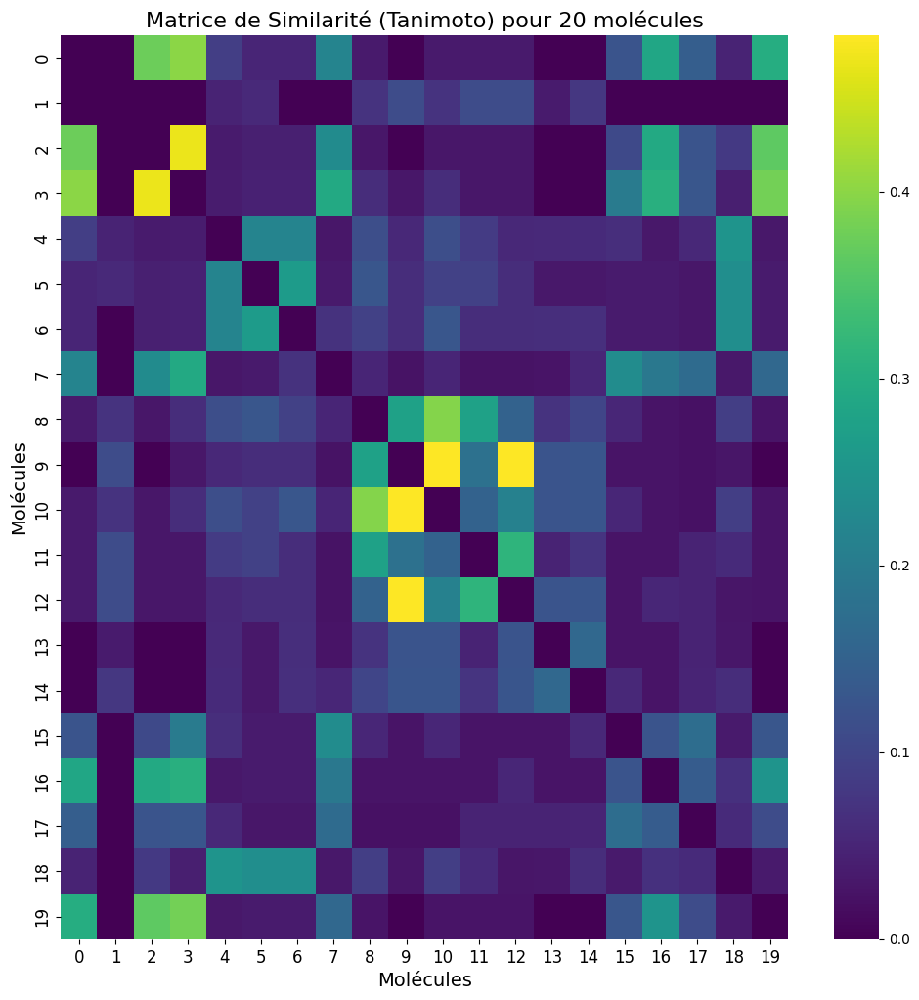

In [69]:
# Réduire la taille de la matrice (exemple : 100 premières molécules)
subset_size = 20  # Ajustez selon vos besoins
similarity_matrix_subset = similarity_matrix[:subset_size, :subset_size]


# Affichage de la matrice pour le sous-ensemble
plt.figure(figsize=(12, 12))  # Taille adaptée au sous-ensemble
sns.heatmap(similarity_matrix_subset, cmap="viridis", annot=False)
plt.title(f"Matrice de Similarité (Tanimoto) pour {subset_size} molécules", fontsize=16)
plt.xlabel("Molécules", fontsize=14)
plt.ylabel("Molécules", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


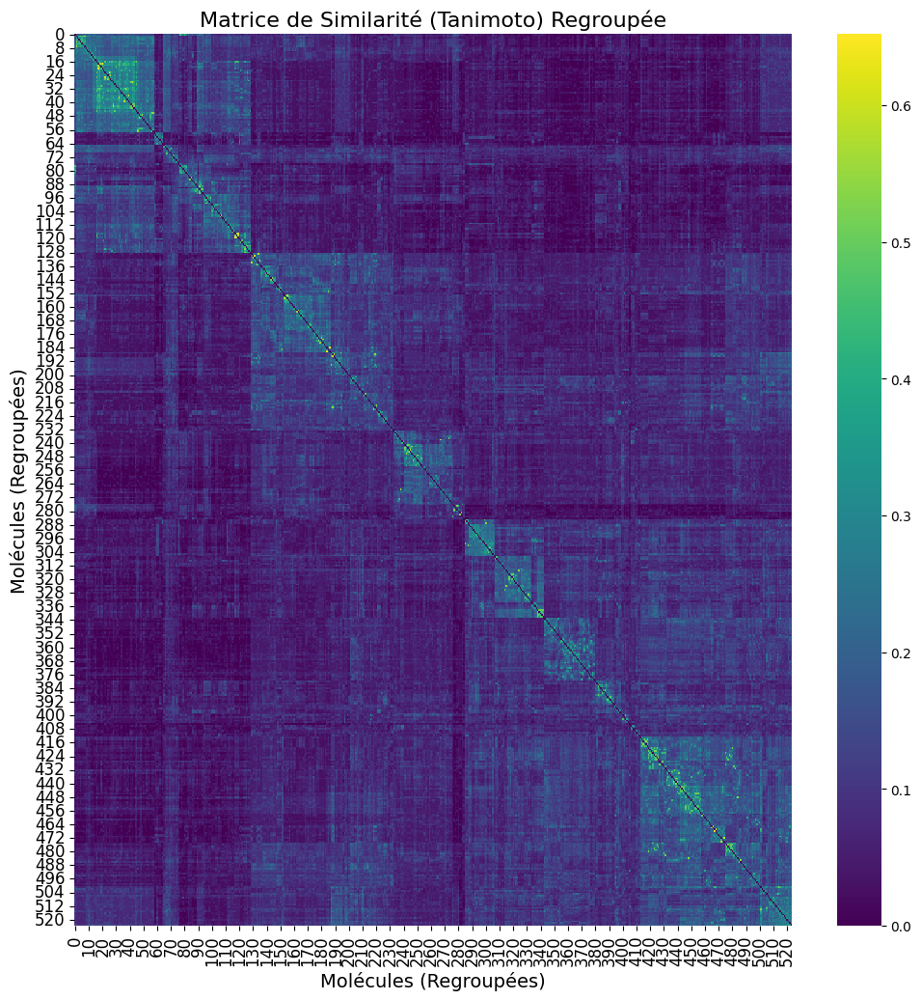

In [61]:
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
import numpy as np

# Calculer le clustering hiérarchique
linkage_matrix = linkage(1 - similarity_matrix, method='average')  # 1 - Similarité pour distance
ordered_indices = leaves_list(linkage_matrix)  # Ordre des indices des molécules après regroupement

# Réorganiser la matrice en fonction des clusters
clustered_matrix = similarity_matrix[ordered_indices][:, ordered_indices]

# Visualiser la matrice regroupée
plt.figure(figsize=(12, 12))
sns.heatmap(clustered_matrix, cmap="viridis", annot=False)
plt.title("Matrice de Similarité (Tanimoto) Regroupée", fontsize=16)
plt.xlabel("Molécules (Regroupées)", fontsize=14)
plt.ylabel("Molécules (Regroupées)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


In [63]:
!pip install plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 1.8 MB/s eta 0:00:00m eta 0:00:010:00:01


In [70]:
import plotly.express as px
import pandas as pd

# Convertir la matrice en DataFrame
similarity_df = pd.DataFrame(similarity_matrix)


# Créer une visualisation interactive
fig = px.imshow(similarity_df, color_continuous_scale='viridis', title="Matrice de Similarité (Tanimoto)")
fig.update_layout(width=800, height=800)
fig.show()


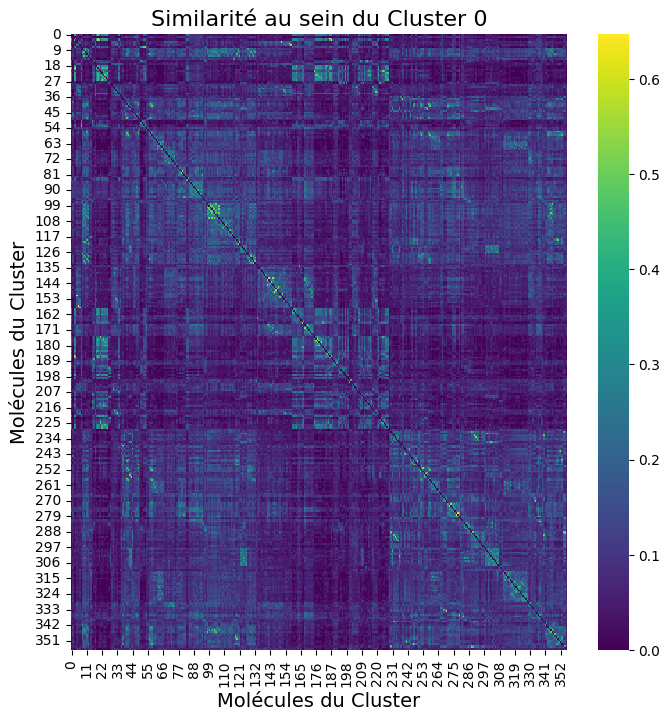

In [65]:
cluster_id = 0  # Exemple : analyser uniquement le cluster 0
cluster_indices = selected_molecules[selected_molecules['Cluster'] == cluster_id].index
cluster_matrix = similarity_matrix[np.ix_(cluster_indices, cluster_indices)]

plt.figure(figsize=(8, 8))
sns.heatmap(cluster_matrix, cmap="viridis", annot=False)
plt.title(f"Similarité au sein du Cluster {cluster_id}", fontsize=16)
plt.xlabel("Molécules du Cluster", fontsize=14)
plt.ylabel("Molécules du Cluster", fontsize=14)
plt.show()


In [66]:
similarity_df.to_csv("similarity_matrix.csv", index=False)


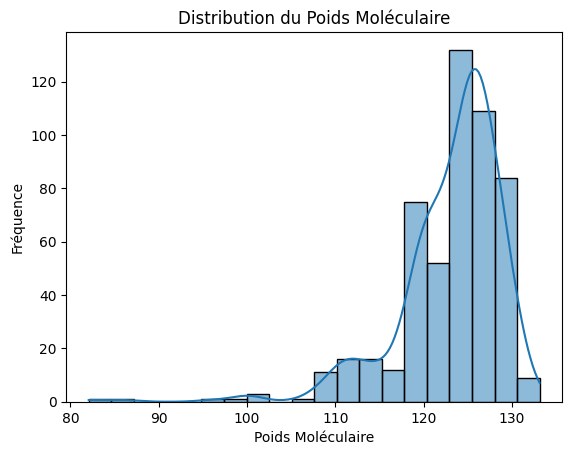

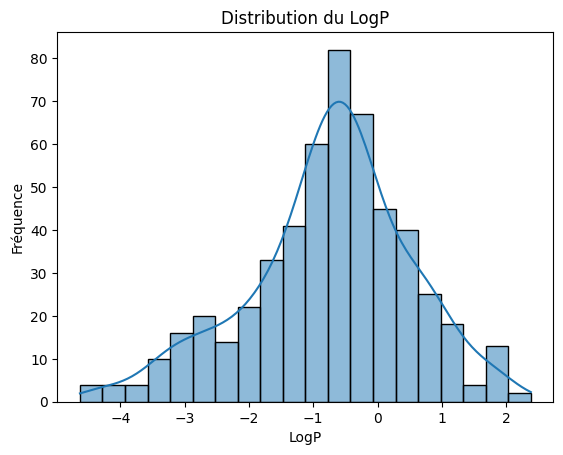

In [52]:
selected_molecules['Molecular_Weight'] = selected_molecules['smiles'].apply(lambda x: Descriptors.MolWt(Chem.MolFromSmiles(x)))
selected_molecules['LogP'] = selected_molecules['smiles'].apply(lambda x: Descriptors.MolLogP(Chem.MolFromSmiles(x)))

# Visualisation
sns.histplot(selected_molecules['Molecular_Weight'], bins=20, kde=True)
plt.title("Distribution du Poids Moléculaire")
plt.xlabel("Poids Moléculaire")
plt.ylabel("Fréquence")
plt.show()

sns.histplot(selected_molecules['LogP'], bins=20, kde=True)
plt.title("Distribution du LogP")
plt.xlabel("LogP")
plt.ylabel("Fréquence")
plt.show()


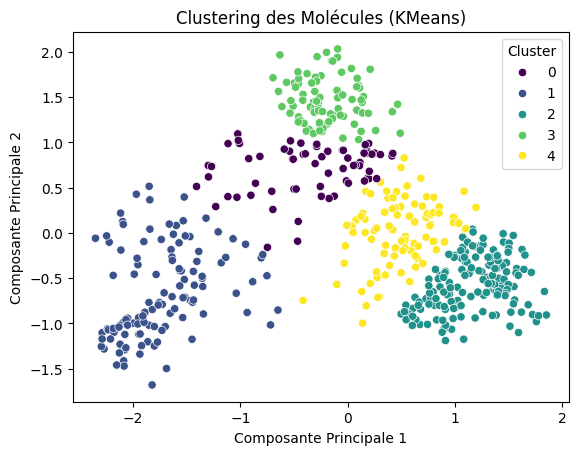

In [53]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Réduction de dimension des fingerprints
pca = PCA(n_components=2)
fingerprint_2d = pca.fit_transform(fingerprints)

# Clustering
kmeans = KMeans(n_clusters=5, random_state=42).fit(fingerprint_2d)
selected_molecules['Cluster'] = kmeans.labels_

# Visualisation
sns.scatterplot(x=fingerprint_2d[:, 0], y=fingerprint_2d[:, 1], hue=selected_molecules['Cluster'], palette="viridis")
plt.title("Clustering des Molécules (KMeans)")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.show()


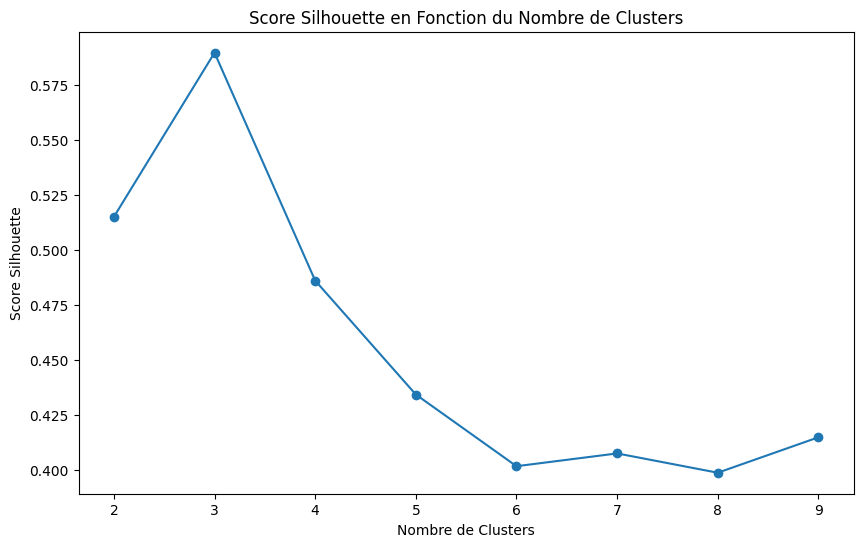

Nombre optimal de clusters : 3


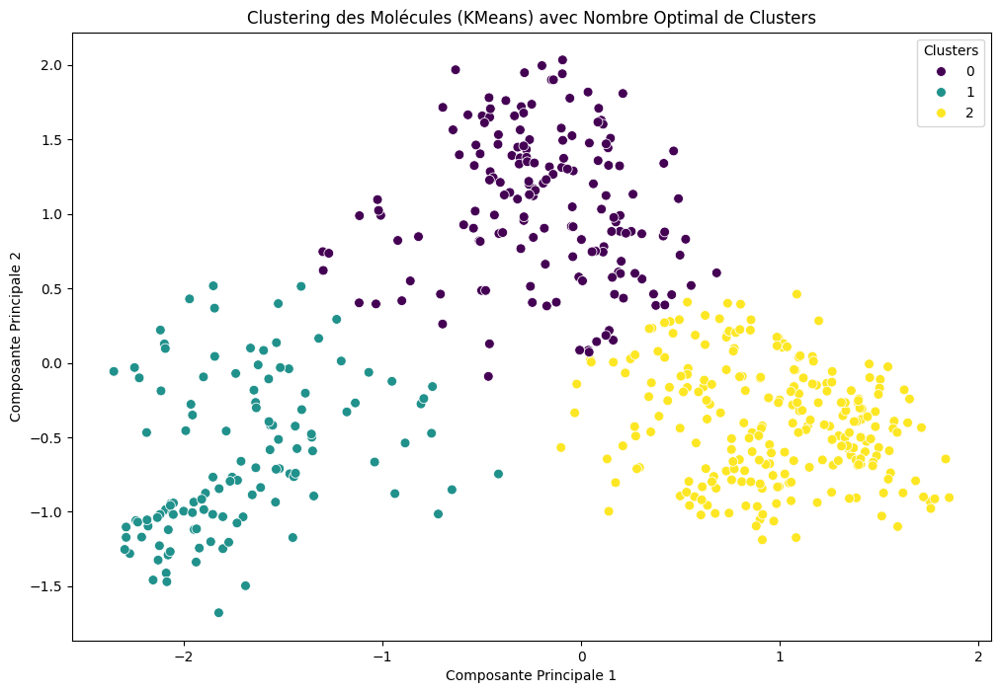

In [57]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Réduction de dimension des fingerprints
pca = PCA(n_components=2)
fingerprint_2d = pca.fit_transform(fingerprints)

# Trouver le nombre optimal de clusters
range_clusters = range(2, 10)  # Tester entre 2 et 10 clusters
silhouette_scores = []

for n_clusters in range_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(fingerprint_2d)
    score = silhouette_score(fingerprint_2d, labels)
    silhouette_scores.append(score)

# Visualiser les scores silhouette
plt.figure(figsize=(10, 6))
plt.plot(range_clusters, silhouette_scores, marker='o')
plt.title("Score Silhouette en Fonction du Nombre de Clusters")
plt.xlabel("Nombre de Clusters")
plt.ylabel("Score Silhouette")
plt.show()

# Nombre optimal de clusters
optimal_clusters = range_clusters[silhouette_scores.index(max(silhouette_scores))]
print(f"Nombre optimal de clusters : {optimal_clusters}")

# Appliquer KMeans avec le nombre optimal de clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
selected_molecules['Cluster'] = kmeans.fit_predict(fingerprint_2d)

# Visualisation des clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=fingerprint_2d[:, 0], 
    y=fingerprint_2d[:, 1], 
    hue=selected_molecules['Cluster'], 
    palette="viridis",
    s=50
)
plt.title("Clustering des Molécules (KMeans) avec Nombre Optimal de Clusters")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend(title="Clusters")
plt.show()


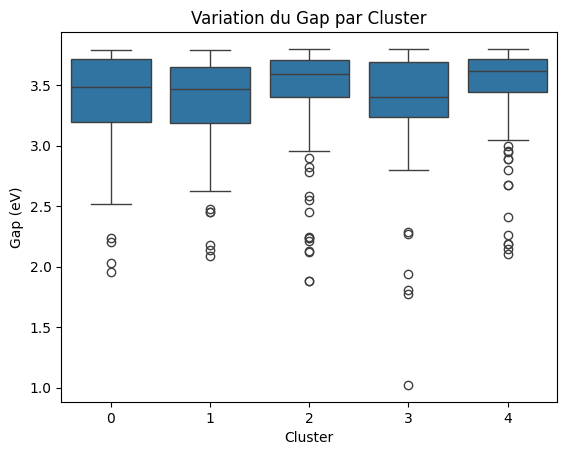

In [54]:
sns.boxplot(x='Cluster', y='GAP_DFT(eV)', data=selected_molecules)
plt.title("Variation du GAP_DFT par Cluster")
plt.xlabel("Cluster")
plt.ylabel("GAP_DFT (eV)")
plt.show()


Calcul des descripteurs Mordred...
Nettoyage des descripteurs Mordred...


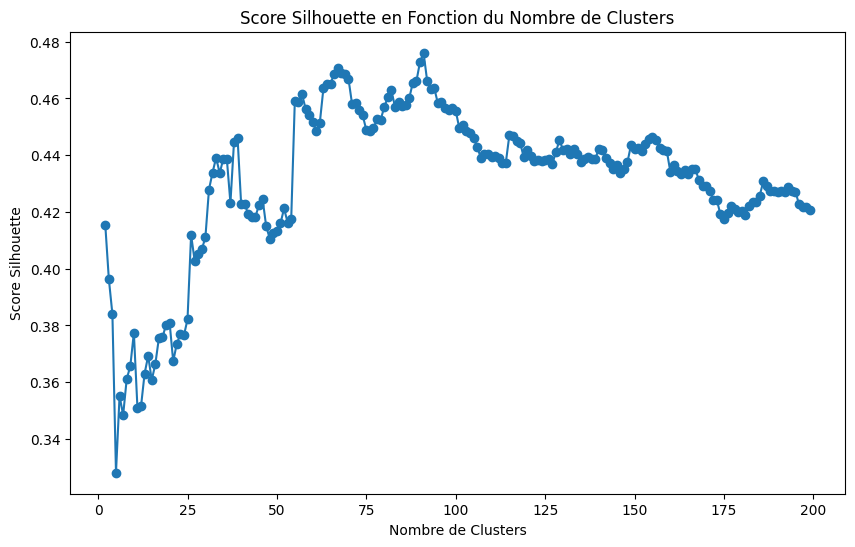

Nombre optimal de clusters : 91


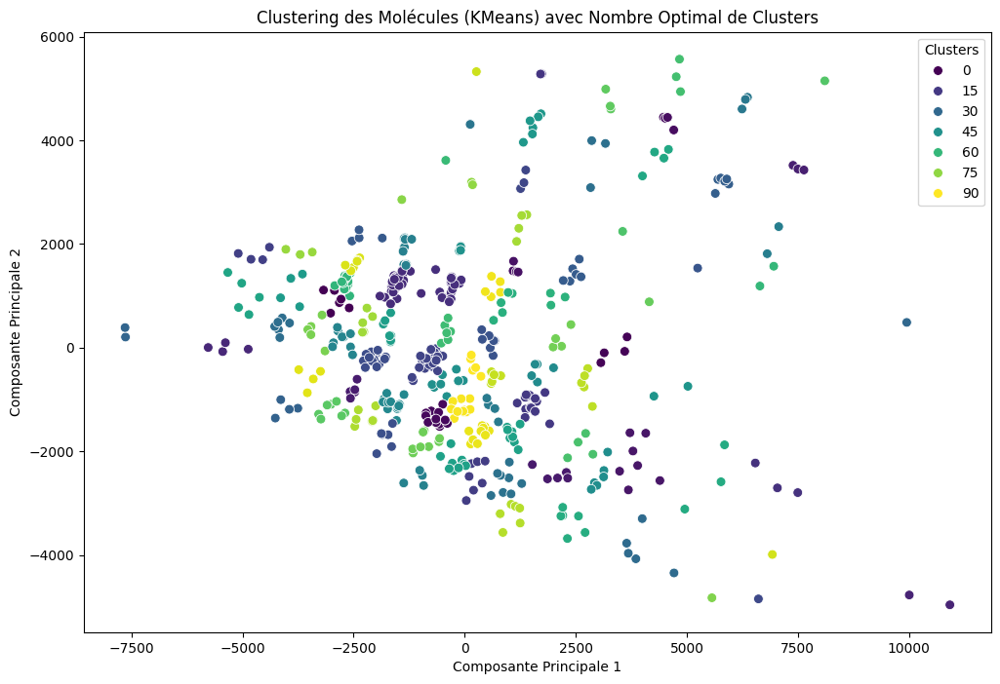

In [71]:
from mordred import Calculator, descriptors
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Fonction pour calculer les descripteurs Mordred
def calculate_mordred(smiles_list):
    """
    Calcule les descripteurs Mordred pour une liste de molécules SMILES.
    """
    calc = Calculator(descriptors, ignore_3D=True)
    descriptors_list = []
    for smiles in smiles_list:
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            descriptors_list.append(calc(mol))
        else:
            descriptors_list.append(None)
    return pd.DataFrame(descriptors_list)



# Calcul des descripteurs Mordred
print("Calcul des descripteurs Mordred...")
mordred_descriptors = calculate_mordred(selected_molecules['smiles'])

# Nettoyage des descripteurs Mordred (supprimer NaN et colonnes invariantes)
print("Nettoyage des descripteurs Mordred...")
mordred_descriptors = mordred_descriptors.select_dtypes(exclude=["object"])
mordred_descriptors.dropna(axis=1, inplace=True)  # Supprimer les colonnes avec des NaN
mordred_descriptors = mordred_descriptors.loc[:, mordred_descriptors.var() > 0]  # Supprimer les colonnes invariantes

# Réduction de dimension des descripteurs Mordred
pca = PCA(n_components=2)
mordred_2d = pca.fit_transform(mordred_descriptors)

# Trouver le nombre optimal de clusters
range_clusters = range(2, 200)  # Tester entre 2 et 10 clusters
silhouette_scores = []

for n_clusters in range_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(mordred_2d)
    score = silhouette_score(mordred_2d, labels)
    silhouette_scores.append(score)

# Visualiser les scores silhouette
plt.figure(figsize=(10, 6))
plt.plot(range_clusters, silhouette_scores, marker='o')
plt.title("Score Silhouette en Fonction du Nombre de Clusters")
plt.xlabel("Nombre de Clusters")
plt.ylabel("Score Silhouette")
plt.show()

# Nombre optimal de clusters
optimal_clusters = range_clusters[silhouette_scores.index(max(silhouette_scores))]
print(f"Nombre optimal de clusters : {optimal_clusters}")

# Appliquer KMeans avec le nombre optimal de clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
selected_molecules['Cluster'] = kmeans.fit_predict(mordred_2d)

# Visualisation des clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=mordred_2d[:, 0], 
    y=mordred_2d[:, 1], 
    hue=selected_molecules['Cluster'], 
    palette="viridis",
    s=50
)
plt.title("Clustering des Molécules (KMeans) avec Nombre Optimal de Clusters")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend(title="Clusters")
plt.show()


In [4]:
import pandas as pd
df=pd.read_pickle('')

In [5]:
df

,smiles_key,smiles,HOMO,LUMO,Gap,HOMO(eV),LUMO(eV),Gap(eV),Scharber_Gap(eV)
0,gdb 326,O=CC(=O)C=O,-0.2606,-0.1455,0.1151,-7.091287,-3.959257,3.132031,3.132031
1,gdb 723,C1=NN=CN=N1,-0.2475,-0.1121,0.1355,-6.734818,-3.050396,3.687143,3.687143
2,gdb 1587,CC(=O)C(=O)C=O,-0.2489,-0.1149,0.1340,-6.772914,-3.126588,3.646326,3.646326
3,gdb 1589,NC(=O)C(=O)C=O,-0.2482,-0.1217,0.1265,-6.753866,-3.311626,3.442240,3.442240
4,gdb 2115,O=C1CC=CC1=O,-0.2347,-0.0951,0.1396,-6.386512,-2.587803,3.798709,3.798709
...,...,...,...,...,...,...,...,...,...
519,gdb 133853,OC12C3C1N1CC3N=C21,-0.2087,-0.0889,0.1198,-5.679016,-2.419092,3.259924,3.259924
520,gdb 133854,CC12CC34CC=C(C13)C24,-0.1575,-0.0912,0.0663,-4.285793,-2.481678,1.804115,1.804115
521,gdb 133858,CC1N2C3C4=CCC13C24,-0.1693,-0.1041,0.0652,-4.606888,-2.832705,1.774182,1.774182
522,gdb 133864,C1C2CC3OC4CC1C234,-0.1386,-0.0638,0.0747,-3.771498,-1.736086,2.032691,2.032691


In [8]:
import os
import shutil
import pandas as pd
import re

# 📂 Définition des chemins
input_csv = "filtered_molecules.pkl"  # Remplacez par le chemin de votre fichier CSV
source_folder = "GDB-V2024"  # Dossier contenant tous les fichiers .xyz
destination_folder = "GDB9_XYZ"  # Dossier où stocker les fichiers extraits

# 📂 Création du dossier de sortie s'il n'existe pas
os.makedirs(destination_folder, exist_ok=True)

# 📄 Chargement du DataFrame contenant les identifiants
df = pd.read_pickle(input_csv)

# 🔍 Extraction des identifiants entiers après "gdb" dans smiles_key
df["identifier"] = df["smiles_key"].str.extract(r'gdb\s*(\d+)', expand=False).astype(str)

# 🔍 Recherche et copie des fichiers correspondant aux identifiants
for identifier in df["identifier"].dropna().unique():
    xyz_filename = f"GDB{identifier}.xyz"
    source_path = os.path.join(source_folder, xyz_filename)
    destination_path = os.path.join(destination_folder, xyz_filename)

    # 📂 Vérifier si le fichier existe avant de le copier
    if os.path.exists(source_path):
        shutil.copy(source_path, destination_path)
        print(f"✅ Fichier {xyz_filename} copié dans {destination_folder}")
    else:
        print(f"⚠️ Fichier {xyz_filename} non trouvé dans {source_folder}")

print("\n🔹 Extraction des fichiers XYZ terminée !")


✅ Fichier GDB326.xyz copié dans GDB9_XYZ
✅ Fichier GDB723.xyz copié dans GDB9_XYZ
✅ Fichier GDB1587.xyz copié dans GDB9_XYZ
✅ Fichier GDB1589.xyz copié dans GDB9_XYZ
✅ Fichier GDB2115.xyz copié dans GDB9_XYZ
✅ Fichier GDB2124.xyz copié dans GDB9_XYZ
✅ Fichier GDB2125.xyz copié dans GDB9_XYZ
✅ Fichier GDB4019.xyz copié dans GDB9_XYZ
✅ Fichier GDB4605.xyz copié dans GDB9_XYZ
✅ Fichier GDB4608.xyz copié dans GDB9_XYZ
✅ Fichier GDB4611.xyz copié dans GDB9_XYZ
✅ Fichier GDB4613.xyz copié dans GDB9_XYZ
✅ Fichier GDB4618.xyz copié dans GDB9_XYZ
✅ Fichier GDB4807.xyz copié dans GDB9_XYZ
✅ Fichier GDB5034.xyz copié dans GDB9_XYZ
✅ Fichier GDB6059.xyz copié dans GDB9_XYZ
✅ Fichier GDB6273.xyz copié dans GDB9_XYZ
✅ Fichier GDB6683.xyz copié dans GDB9_XYZ
✅ Fichier GDB7902.xyz copié dans GDB9_XYZ
✅ Fichier GDB8721.xyz copié dans GDB9_XYZ
✅ Fichier GDB8723.xyz copié dans GDB9_XYZ
✅ Fichier GDB8779.xyz copié dans GDB9_XYZ
✅ Fichier GDB8786.xyz copié dans GDB9_XYZ
✅ Fichier GDB8792.xyz copié dans GDB